# **Desafio de ciência de dados Raízen**
# **NYC subway dataset**

|Análise e modelagem  de fluxo de passageiros no metrô de NY|
|:-----------------------------------------------|
|**Autor:** Danilo Pedrelli|
|**Data:** Outubro de 2021|

|SUMÁRIO|
|:------------------|
|[**1. Introdução**](#intro)|
|[**2. Dados**](#dados)|
|[2.1 Análise descritiva](#desc)|
|[**3. Pré-processamento**](#pre)|
|[**4. Análise exploratória de dados**](#eda)|
|[4.1 Análise de série temporal](#serie)|
|[4.2 Teste de Dickey Fuller e auto-correlação](#autocorr)|
|[**5. Modelagem**](#modelos)|
|[5.1 ARIMA](#arima)|
|[5.2 LightGBM](#lgbm)|
|[5.3 Engenharia de variáveis](#eng)|
|[5.4 Regressão linear simples e importância de variáveis](#linear)|
|[5.4.1 Scaling](#scaling)|
|[5.4.2 Ridge](#ridge)|
|[5.4.3 Lasso](#lasso)|
|[5.5 XGBoost Regressor](#xgb)|
|[**6. Modelos de Deep Learning para séries temporais**](#deep)|
|[6.1 MLP](#mlp)|
|[6.2 CNN](#cnn)|
|[6.3 LSTM](#lstm)|
|[**7. Considerações finais**](#conclusao)|
|[7.1 Perpectivas ](#perspectivas)|
|[**8. Referências**](#refs)|

## 1. Introdução <a name=intro></a>

O presente relatório apresenta um estudo sobre um conjunto de dados do metrô de Nova York, a fim de estimar o tráfego de usuários. O metro em Nova York possui várias linhas, e é um dos mais movimentados do mundo, abaixo segue descrição da Wikipédia:

*"O Metropolitano de Nova Iorque (em inglês The New York City Subway, New York Subway ou somente Subway) é um sistema de metropolitano que pertence à Cidade de Nova York e que é administrado pela New York City Transit Authority, uma agência subsidiada pela Metropolitan Transportation Authority, também conhecida como MTA New York City Transit. É um dos mais antigos e extensos sistemas de transporte público do mundo, atrás apenas do metrô de Londres, com 468 estações em operação (423, se as estações de conexão por transferência forem consideradas uma só), 369 km de serviços, 1 056 km de trilhos, 1 355 km de trilhos incluindo pátios e estacionamento de trens. Em 2009 o metrô transportou mais de 1,579 bilhões de passageiros, com uma média de cinco milhões (5 086 833) nos dias de semana, 2,9 milhões aos sábados e 2,2 milhões aos domingos."*

Na Figura abaixo mostramos o diagrama de linhas do metrô:

In [1]:
from IPython.display import display, Image
display(Image(filename='NYC_subway-4D.jpg',width=1000, height=1000))

A Metropolitan Transportation Authority (MTA), é reponsável por gerir o metrô de Nova York, realizando auditorias para computar a quantidade de passageiros que utiliza o sistema de transporte, a fim de averiguar faturamento, fluxo de passageiros, e necessidades de manutenção, entre outra tarefas associadas à gestão do metrô. No presente relatório, analisamos um conjunto de dados obtido da MTA, que traz informações das auditorias realizadas nas catracas.

Em nosso conjunto de dados, possuímos as seguintes variáveis:


- CA = Control Area (A002), é a área de controle de acesso dos passageiros;
- UNIT = Remote Unit for a station (R051), unidade remota para determinada estação;
- SCP = Subunit Channel Position (02-00-00), representa o endereço específico de um aparelho, usualmente catraca;
- STATION = Representa a estação onde o aparelho se encontra;
- LINENAME = Representa as linhas que podem ser embarcadas na respectiva estação. Normalmente cada linha é representadas por um único caractere, e.g. LINENAME 456NQR significa que os tréns 4, 5, 6, N, Q, e R passam por aquela estação;
- DIVISION = Representa a "linha" que a estação era originalmente pertencente. BMT - Brooklyn–Manhattan Transit Corporation, IRT - Interborough Rapid Transit Company, ou IND - Independent Subway System;
- TIME = Representa o dia e hora de um evento de auditoria (AA-MM-DD hh:mm:ss);
- DESc = identifica o tipo de auditoria realizada, se REGULAR ou não (normalmente ocorrendo a cada 4 horas). Auditorias podem ocorrer fora do intervalo de 4 horas, devido a planejamentos ou solução de problemas. Adicionalmente, pode haver uma recuperação de auditoria que foi perdida, chamada de RECOVR AUD.
- ENTRIES = Valor cumulativo de entradas registradas pela catraca;
- EXIST = Valor cumulativo de saídas registradas pela catraca.

O estudo do fluxo de usuários pode auxiliar, por exemplo, no entendimento dos melhores dias para fazer manutenção, qual o faturamento mensal de cada estação, o intervalo de manutenção de cada estação ou linha de trem, entre outras motivações. Nesse contexto, o relatório divide-se em:

- Engenharia de variáveis e pré-processamento:

Aqui realizamos um processo de reestruturação do dataset, filtrando para uma área de controle e subunidade específica, modificando o intervalo para diário, removendo valores duplicados, verificando valores inconsistentes, realizar reamostragem dos dados, etren outros.

- Análise exploratória

Nessa etapa respondemos algumas perguntas que podem ser relevantes para a gestão do metrô, ou mesmo para seus usuários. Como volume de tráfego por estação, dias com maior quantidade de usuários. Periodicidade do tráfego, etc.

- Modelagem

Entender as características de cada estação, área de controle, etc é de fundamental importância, porém também é muito relevante conseguir prever o tráfego de usuários para realizar planejamentos financeiros, técnicos, etc. Desse modo, criamos alguns modelos com o objetivo de realizar essa previsão, comparando métricas para avaliar a qualidade dos mesmo.

## 2. Dados <a name=dados></a> 

__Bibliotecas__

In [2]:
# Preparando o ambiente
import pandas as pd
pd.set_option('max_columns',1000)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar # Feriados americanos
from tqdm import tqdm

from pandas.plotting import autocorrelation_plot # plot da autocorrelação
from sktime.utils.plotting import plot_series # plot da série temporal

from sktime.forecasting.model_selection import temporal_train_test_split # train tes split
from sktime.forecasting.base import ForecastingHorizon # Horizonte de previsão
from sktime.forecasting.compose import make_reduction

# Modelos
from sktime.forecasting.arima import AutoARIMA
import lightgbm as lgb
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from xgboost import plot_importance

#Métricas
from sktime.performance_metrics.forecasting import mean_squared_percentage_error, mean_absolute_percentage_error,mean_absolute_error,mean_squared_error
from sklearn.metrics import r2_score, mean_squared_log_error

import statsmodels.formula.api as smf # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs



# Algoritmos de Deep Learning
from keras import optimizers
from keras.utils.vis_utils import plot_model
from keras.models import Sequential, Model
from keras.layers.convolutional import Conv1D, MaxPooling1D
from keras.layers import Dense, LSTM, Flatten
import tensorflow as tf
from tensorflow.random import set_seed
from numpy.random import seed
set_seed(1)
seed(1)

# Função que retorna dataframes lado a lado
from IPython.core.display import display, HTML

def display_side_by_side(dfs:list, captions:list,show_caption=True):
    """Display tables side by side to save vertical space
    Input:
        dfs: list of pandas.DataFrame
        captions: list of table captions
    """
    output = ""
    if show_caption:
        combined = dict(zip(captions, dfs))
        for caption, df in combined.items():
            output += df.style.set_table_attributes("style='display:inline'").set_caption(caption)._repr_html_()
            output += "\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0"
    else:
        for df in dfs:
            output += df.style.set_table_attributes("style='display:inline'")._repr_html_()
            output += "\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0\xa0"
    display(HTML(output))

Inicialmente, iremos trabalhar com os dados de 2010:

In [3]:
df = pd.read_csv('2010.csv.gz', parse_dates = ['time'])
df.head()

,time,ca,unit,scp,station,linename,division,desc,entries,exits
0,2010-04-17 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2704717.0,928793.0
1,2010-04-17 04:00:00,A002,R051,02-00-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2697632.0,566683.0
2,2010-04-17 04:00:00,A002,R051,02-03-00,LEXINGTON AVE,456NQR,BMT,REGULAR,1127722.0,3943492.0
3,2010-04-17 04:00:00,A002,R051,02-03-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2425570.0,3733289.0
4,2010-04-17 04:00:00,A002,R051,02-03-02,LEXINGTON AVE,456NQR,BMT,REGULAR,2214633.0,3021589.0


In [ ]:
df.shape

### 2.1 Análise descritiva <a name=desc></a>

Para entendermos melhor os dados, realizamos uma primeira análise descritiva dos mesmos:

In [4]:
display_side_by_side([df.describe(), df.describe(include=['O', 'category']), df[['time']].describe()],captions=None,show_caption=False)

De partida, é possível ver que há valores negativos de entrada e saída, o que deve ser considerado como algum erro de medição, e portanto deve ser tratado. Também verificamos que as auditorias se iniciam em 17/04/2010, e continuam até o final do ano.

Abaixo, calculamos a contagem de frequência para as coluas categóricas, mostrando os 10 itens mais frequentes:

In [5]:
df_ca = pd.DataFrame(df['ca'].value_counts().head(10))
df_unit = pd.DataFrame(df['unit'].value_counts().head(10))
df_scp = pd.DataFrame(df['scp'].value_counts().head(10))
df_station = pd.DataFrame(df['station'].value_counts().head(10))
df_linename = pd.DataFrame(df['linename'].value_counts().head(10))
df_division = pd.DataFrame(df['division'].value_counts().head(10))
df_desc = pd.DataFrame(df['desc'].value_counts().head(10))

display_side_by_side([df_ca, df_unit, df_scp,df_station, df_linename, df_division,df_desc],captions=None,show_caption=False)

,ca
N208,62276
R203,61370
R204,60900
R158,60795
N103,59526
PTH08,42260
PTH05,39151
PTH03,38193
R610,35277
PTH07,35152


É importante também verificar se existem valores ausentes no dataframe:

In [6]:
df.isna().sum()

time            0
ca              0
unit            0
scp             0
station     10148
linename    10148
division    10148
desc            0
entries         0
exits           0
dtype: int64

Dos 7420384 registros, 10148 não possuem dados de station, linename ou division. Não identificamos um tratamento que possa ser feito para atribuir valores aos mesmos, portanto, os removeremos da base a ser analisada.

## 3. Pré-processamento <a name=pre></a>

Após  testes e consulta a referências (citadas ao final deste relatório, mais especificamente as que analisam dados do metrô de Nova York, cujos projetos se encontram no GitHub), definimos as seguintes etapas de pré-processamento e criação de novas variáveis:

1. Filtrar por auditoria REGULAR
1. Verificar e remover valores duplicados
1. Filtrar por ca e scp, obter entries e exits por intervalo
1. Substituir valores de intervalos maiores que 1 dia e remover entries e exits acumulados
1. Fazer resample por dia e substituir nulos pelos valor da semana anterior
1. Criar variáveis de ano, mês, dia, hora, feriado e dia da semana, e variável de tráfego

Ao contrário dos projetos citados, que realizam análises sobre dados por hora, nosso objetivo será trabalhar com o acumulado do dia. Optamos por essa abordagem, tanto para trazer um análise diferentes das citadas, quanto pelo fato de as horas em que são realizadas as auditorias não serem sempre as mesmas, o que acreditamos ser um ponto que pode influenciar nos resultados.

__1. Filtrar por auditoria REGULAR__

In [69]:
def regular_data(df):
    data = df.copy()
    return data[data['desc']=='REGULAR'].reset_index(drop=True)

In [25]:
df1 = regular_data(df)
df1.head()

,time,ca,unit,scp,station,linename,division,desc,entries,exits
0,2010-04-17 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2704717.0,928793.0
1,2010-04-17 04:00:00,A002,R051,02-00-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2697632.0,566683.0
2,2010-04-17 04:00:00,A002,R051,02-03-00,LEXINGTON AVE,456NQR,BMT,REGULAR,1127722.0,3943492.0
3,2010-04-17 04:00:00,A002,R051,02-03-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2425570.0,3733289.0
4,2010-04-17 04:00:00,A002,R051,02-03-02,LEXINGTON AVE,456NQR,BMT,REGULAR,2214633.0,3021589.0


__2. Verificar e remover valores duplicados__

In [26]:
def duplicated_rows(df, verbose=True):
    data = df.copy()
    if verbose: print('A quantidade de linhas duplicadas a serem removidas é:',df.duplicated().sum())
    
    data.drop_duplicates(inplace=True)
    
    return data.reset_index(drop=True)

In [27]:
df2 = duplicated_rows(df1)
df2.head()

A quantidade de linhas duplicadas a serem removidas é: 30035


,time,ca,unit,scp,station,linename,division,desc,entries,exits
0,2010-04-17 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2704717.0,928793.0
1,2010-04-17 04:00:00,A002,R051,02-00-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2697632.0,566683.0
2,2010-04-17 04:00:00,A002,R051,02-03-00,LEXINGTON AVE,456NQR,BMT,REGULAR,1127722.0,3943492.0
3,2010-04-17 04:00:00,A002,R051,02-03-01,LEXINGTON AVE,456NQR,BMT,REGULAR,2425570.0,3733289.0
4,2010-04-17 04:00:00,A002,R051,02-03-02,LEXINGTON AVE,456NQR,BMT,REGULAR,2214633.0,3021589.0


__3. Filtrar por ca e scp (com entries e exits maior ou igual a zero), obter entries e exits por intervalo__

In [28]:
def filter_shift(df,ca,scp):
    data = df[(df['ca']==ca)&(df['scp']==scp)&(df['entries']>=0)&(df['exits']>=0)].copy()
    data['time_shift'] = data['time'] - data.shift(1)['time']
    data['entries_shift'] = data['entries'] - data['entries'].shift(1)
    data['exits_shift'] = data['exits'] - data['exits'].shift(1)
    data = data.dropna().reset_index(drop=True)
    
    return data

In [29]:
df3 = filter_shift(df2, 'A002', '02-00-00')
df3.head()

,time,ca,unit,scp,station,linename,division,desc,entries,exits,time_shift,entries_shift,exits_shift
0,2010-04-17 08:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2704723.0,928795.0,04:00:00,6.0,2.0
1,2010-04-17 12:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2704731.0,928816.0,04:00:00,8.0,21.0
2,2010-04-17 16:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2704835.0,928898.0,04:00:00,104.0,82.0
3,2010-04-17 20:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2705074.0,928943.0,04:00:00,239.0,45.0
4,2010-04-18 00:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2705399.0,928981.0,04:00:00,325.0,38.0


In [30]:
df3.shape

(1419, 13)

__4. Substituir valores de intervalos maiores que 1 dia e remover entries e exits acumulados__

In [31]:
df3[df3['time_shift']> '1 day']

,time,ca,unit,scp,station,linename,division,desc,entries,exits,time_shift,entries_shift,exits_shift
39,2010-05-01 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2721143.0,934743.0,7 days 04:00:00,8044.0,2970.0
122,2010-05-22 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2746360.0,943930.0,7 days 04:00:00,8525.0,3167.0


In [32]:
def gap_numbers(df):
    data = df.drop(['entries', 'exits'],axis=1)
    data.loc[data['time_shift']> '1 day', 'entries_shift'] = (data.loc[data['time_shift']> '1 day', 'entries_shift']/(6*data[data['time_shift']> '1 day']['time_shift'].dt.days)).astype(int)
    data.loc[data['time_shift']> '1 day', 'exits_shift'] = (data.loc[data['time_shift']> '1 day', 'exits_shift']/(6*data[data['time_shift']> '1 day']['time_shift'].dt.days)).astype(int)
    return data

In [33]:
df4 = gap_numbers(df3)
df4[df4['time_shift']> '1 day']

,time,ca,unit,scp,station,linename,division,desc,time_shift,entries_shift,exits_shift
39,2010-05-01 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,7 days 04:00:00,191.0,70.0
122,2010-05-22 04:00:00,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,7 days 04:00:00,202.0,75.0


__5. Fazer resample por dia e substituir nulos pelos valor da semana anterior__

In [34]:
def resample_func(df):
    df_resample = df.set_index('time').resample('1D').sum()
    df_resample_shift = df_resample.shift(7)
    
    df_replace = df_resample.loc[df_resample['entries_shift']==0,:]
    df_resample.loc[df_replace.index,'entries_shift'] = df_resample_shift.loc[df_replace.index,'entries_shift']
    df_resample.loc[df_replace.index,'exits_shift'] = df_resample_shift.loc[df_replace.index,'exits_shift']
    
    for x in ['ca', 'unit', 'scp', 'station', 'linename', 'division', 'desc']:
        df_resample[x] = df[x].unique()[0]
    return df_resample.reset_index()

In [35]:
df5 = resample_func(df4)
df5.head()

,time,entries_shift,exits_shift,ca,unit,scp,station,linename,division,desc
0,2010-04-17,357.0,150.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR
1,2010-04-18,583.0,158.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR
2,2010-04-19,678.0,487.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR
3,2010-04-20,1375.0,479.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR
4,2010-04-21,1461.0,551.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR


In [36]:
df5[df5['entries_shift']==0]

,time,entries_shift,exits_shift,ca,unit,scp,station,linename,division,desc


__6. Criar variáveis de ano, mês, dia, hora, feriado e dia da semana, e variável de tráfego__

In [37]:
def ano_mes_hora(df):
    data = df.copy()
    data['year'] = data['time'].dt.year
    data['month'] = data['time'].dt.month
    data['day'] = data['time'].dt.day
    
    # Dia da semana
    data['weekday'] = data['time'].dt.weekday.replace({0:'Seg',1:'Ter', 2:'Qua',3:'Qui',4:'Sex',5:'Sáb', 6:'Dom'})

    # Feriado
    cal = calendar()
    holidays = cal.holidays(start=data['time'].min(), end=data['time'].max())
    data['holiday'] = data['time'].isin(holidays).astype(int)
    
    # Tráfego
    data['traffic'] = data['entries_shift']+data['exits_shift']
    return data

In [38]:
df6 = ano_mes_hora(df5)
df6.head()

,time,entries_shift,exits_shift,ca,unit,scp,station,linename,division,desc,year,month,day,weekday,holiday,traffic
0,2010-04-17,357.0,150.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,17,Sáb,0,507.0
1,2010-04-18,583.0,158.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,18,Dom,0,741.0
2,2010-04-19,678.0,487.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,19,Seg,0,1165.0
3,2010-04-20,1375.0,479.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,20,Ter,0,1854.0
4,2010-04-21,1461.0,551.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,21,Qua,0,2012.0


__7. Aplicando pré-processamento para todo o dataset__

In [39]:
df_all = pd.DataFrame([])

ca_erro = []
scp_erro = []

for ca in tqdm(df2['ca'].unique()):
    for scp in df2.loc[df2['ca']==ca,'scp'].unique():
        try:
            df_shift = filter_shift(df2, ca, scp)
            df_gap = gap_numbers(df_shift)
            df_resample = resample_func(df_gap)
            df_anomes = ano_mes_hora(df_resample)
            df_all = pd.concat([df_all,df_anomes])
        except:
            ca_erro.append(ca)
            scp_erro.append(scp)

100%|████████████████████████████████████████████████████████████████████████████████| 727/727 [59:30<00:00,  4.91s/it]


In [41]:
df_all.head()

,time,entries_shift,exits_shift,ca,unit,scp,station,linename,division,desc,year,month,day,weekday,holiday,traffic
0,2010-04-17,357.0,150.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,17,Sáb,0,507.0
1,2010-04-18,583.0,158.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,18,Dom,0,741.0
2,2010-04-19,678.0,487.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,19,Seg,0,1165.0
3,2010-04-20,1375.0,479.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,20,Ter,0,1854.0
4,2010-04-21,1461.0,551.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,21,Qua,0,2012.0


Abaixo vemos os processo que saíram com erro, a serem verificados com maior detalhe, mas no momento não serão verificados:

In [48]:
pd.DataFrame([scp_erro],columns=ca_erro, index=['scp'])

,N601,R158,R217,R217,R217,R217,R217,R217,R504
scp,00-03-00,00-07-02,00-00-00,00-00-01,00-00-02,00-00-03,00-06-00,00-06-01,00-02-01


Também temos valores de tráfego negativo, provavelmente por medições equivocadas. Iremos eliminar esses registros como solução momentânea, mas aconselhamos uma averiguação dos dados:

In [70]:
df_all[df_all['traffic']<0].head()

,time,entries_shift,exits_shift,ca,unit,scp,station,linename,division,desc,year,month,day,weekday,holiday,traffic
141,2010-09-05,-2763398.0,-4421661.0,A021,R032,01-00-04,42 ST-TIMES SQ,1237ACENQRS,BMT,REGULAR,2010,9,5,Dom,0,-7185059.0
96,2010-07-23,-7245.0,-10966.0,A021,R032,01-00-01,42 ST-TIMES SQ,1237ACENQRS,BMT,REGULAR,2010,7,23,Sex,0,-18211.0
196,2010-10-31,-150781.0,-177376.0,A021,R032,01-00-01,42 ST-TIMES SQ,1237ACENQRS,BMT,REGULAR,2010,10,31,Dom,0,-328157.0
128,2010-08-23,-306046.0,-168744.0,A031,R083,00-00-00,23 ST-5 AVE,NR,BMT,REGULAR,2010,8,23,Seg,0,-474790.0
126,2010-08-21,-2694851.0,-3344697.0,A031,R083,00-03-02,23 ST-5 AVE,NR,BMT,REGULAR,2010,8,21,Sáb,0,-6039548.0


In [73]:
df_pos = df_all[df_all['traffic']>=0].reset_index(drop=True)
df_pos[['entries_shift','exits_shift', 'traffic']].describe()

,entries_shift,exits_shift,traffic
count,1.113688e+06,1.113688e+06,1.113688e+06
mean,1.123350e+03,9.346718e+02,2.058022e+03
std,1.092576e+04,1.347404e+04,2.221211e+04
min,-1.582540e+06,-6.249400e+04,0.000000e+00
25%,3.050000e+02,1.820000e+02,6.730000e+02
50%,8.340000e+02,5.700000e+02,1.606000e+03
75%,1.569000e+03,1.248000e+03,2.842000e+03
max,6.293952e+06,6.926875e+06,1.322083e+07


## 4. Análise exploratória de dados <a name=eda></a>

Primeiramente, para nossa análise, agrupamos os dados por estação:

In [81]:
grouped_station = df_pos.groupby(['time','weekday', 'station', 'holiday', 'month', 'day'],as_index=False)[['entries_shift', 'exits_shift','traffic']].sum().sort_values(by=['time','traffic'],ascending=[True,False], ignore_index=True)
grouped_station

,time,weekday,station,holiday,month,day,entries_shift,exits_shift,traffic
0,2010-04-17,Sáb,34 ST-PENN STA,0,4,17,45471.0,51391.0,96862.0
1,2010-04-17,Sáb,14 ST-UNION SQ,0,4,17,38958.0,56433.0,95391.0
2,2010-04-17,Sáb,34 ST-HERALD SQ,0,4,17,34304.0,41653.0,75957.0
3,2010-04-17,Sáb,86 ST,0,4,17,36939.0,38434.0,75373.0
4,2010-04-17,Sáb,CANAL ST,0,4,17,28036.0,34817.0,62853.0
...,...,...,...,...,...,...,...,...,...
98025,2010-12-31,Sex,BEACH 98 ST,1,12,31,297.0,498.0,795.0
98026,2010-12-31,Sex,AQUEDUCT TRACK,1,12,31,449.0,40.0,489.0
98027,2010-12-31,Sex,PATH WTC 2,1,12,31,346.0,0.0,346.0
98028,2010-12-31,Sex,BEACH 105 ST,1,12,31,104.0,211.0,315.0


Questões a responder com análise exploratória:

1. Qual a estação com maior fluxo de passageiros acumulado no ano?
1. Qual o dia da semana com maior fluxo?
1. O feriado influencia no tráfego?
1. Existem tendências observadas?
1. Exite sazonalidade?
1. Há estacionaridade nos dados?

As três últimas perguntas iremos analisar na seção de séries temporais.

__Qual a estação com maior fluxo de passageiros acumulado no ano?__

In [65]:
pd.DataFrame(grouped_station.groupby('station')['traffic'].sum()).sort_values(by='traffic',ascending=False).head(10)

,traffic
station,
42 ST-GRD CNTRL,50667496.0
14 ST-UNION SQ,47950791.0
86 ST,43778820.0
42 ST-TIMES SQ,40536971.0
34 ST-HERALD SQ,36388473.0
34 ST-PENN STA,34243775.0
42 ST-PA BUS TE,28953163.0
MAIN ST,26214395.0
96 ST,26156518.0


Vemos que 42 ST-GRD CNTRL lidera o ranking das estações mais movimentadas em 2010, com um fluxo total de 50667496 passageiros, seguidos pelas estações 14 ST-UNION SQ e 86 ST, com 47950791 e 43778820 de tráfego, respectivamente.

__1. Qual o dia da semana com maior fluxo para a estação ?__

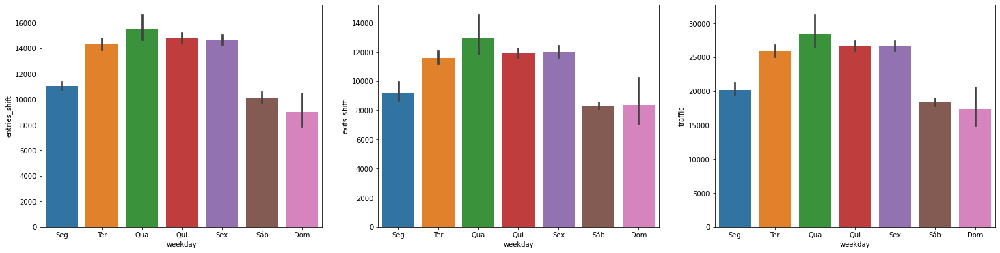

In [75]:
fig, ax = plt.subplots(1,3,figsize=(25,6))
dias = ['Seg','Ter', 'Qua','Qui','Sex','Sáb','Dom']
sns.barplot(data=grouped_station,x='weekday',y='entries_shift', ax=ax[0],order=dias)
sns.barplot(data=grouped_station,x='weekday',y='exits_shift', ax=ax[1],order=dias)
sns.barplot(data=grouped_station,x='weekday',y='traffic', ax=ax[2],order=dias)
plt.show()

Percebemos que quarta feira é o dia com maior tráfego usualmente, havendo sábado e domingo uma queda no fluxo, apesar de haver variância considerável aos domingos.

__O feriado influencia no tráfego?__

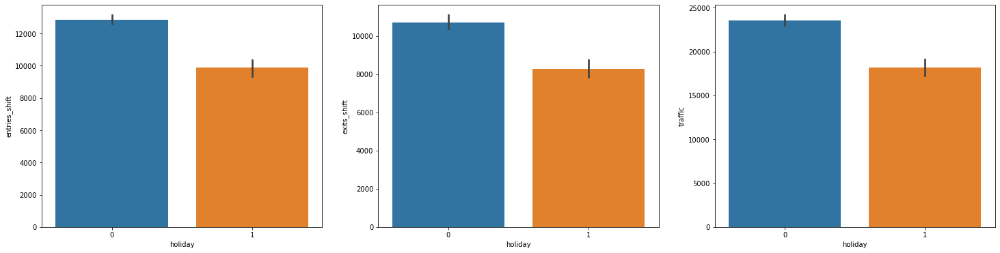

In [77]:
fig, ax = plt.subplots(1,3,figsize=(25,6))
sns.barplot(data=grouped_station,x='holiday',y='entries_shift', ax = ax[0])
sns.barplot(data=grouped_station,x='holiday',y='exits_shift', ax = ax[1])
sns.barplot(data=grouped_station,x='holiday',y='traffic', ax = ax[2])
plt.show()

Percebemos, que, de fato, há um fluxo menor de passageiros no feriado.

__Qual o mês de maior movimentação?__

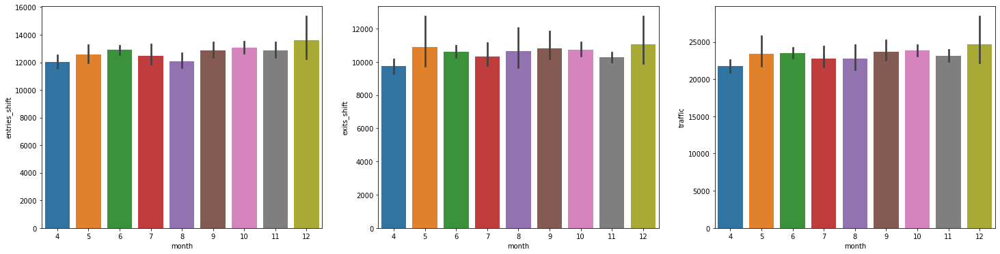

In [80]:
fig, ax = plt.subplots(1,3,figsize=(25,6))
sns.barplot(data=grouped_station,x='month',y='entries_shift', ax=ax[0])
sns.barplot(data=grouped_station,x='month',y='exits_shift', ax=ax[1])
sns.barplot(data=grouped_station,x='month',y='traffic', ax=ax[2])
plt.show()

Apesar de alguma variação, o fluxo parece muito similar entre os meses, no entando, dezembro parece ser um mês, peculiar, vamos olhar mais de perto esse mês:

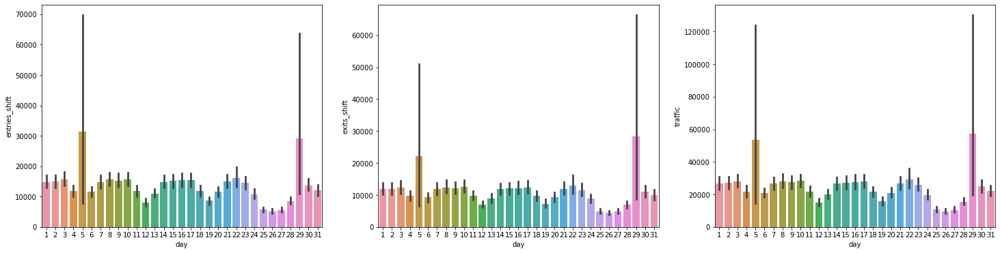

In [82]:
fig, ax = plt.subplots(1,3,figsize=(25,6))
sns.barplot(data=grouped_station[grouped_station['month']==12],x='day',y='entries_shift', ax=ax[0])
sns.barplot(data=grouped_station[grouped_station['month']==12],x='day',y='exits_shift', ax=ax[1])
sns.barplot(data=grouped_station[grouped_station['month']==12],x='day',y='traffic', ax=ax[2])
plt.show()

Interessante, há uma variação sazonal do tráfego, devido os finais de semana, mas dia 5 e 29 de dezembro são dias atípicos, a verificar motivo de tamanha discrepância.

### 4.1 Análise de série temporal <a name=serie></a>

In [83]:
df_time = df6.set_index('time')
df_time.head()

,entries_shift,exits_shift,ca,unit,scp,station,linename,division,desc,year,month,day,weekday,holiday,traffic
time,,,,,,,,,,,,,,,
2010-04-17,357.0,150.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,17,Sáb,0,507.0
2010-04-18,583.0,158.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,18,Dom,0,741.0
2010-04-19,678.0,487.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,19,Seg,0,1165.0
2010-04-20,1375.0,479.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,20,Ter,0,1854.0
2010-04-21,1461.0,551.0,A002,R051,02-00-00,LEXINGTON AVE,456NQR,BMT,REGULAR,2010,4,21,Qua,0,2012.0


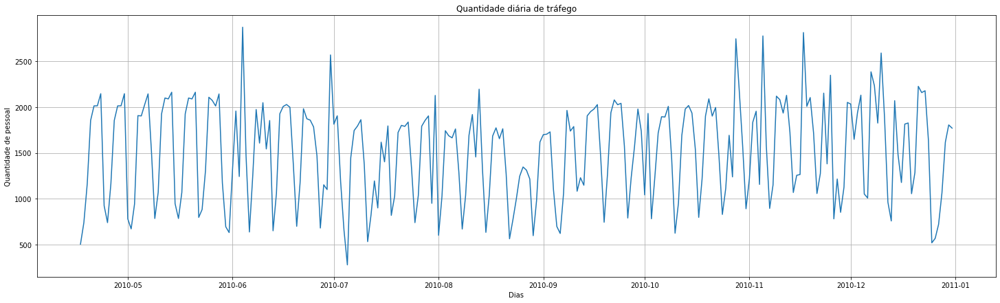

In [84]:
plt.figure(figsize=(25, 7))
plt.plot(df_time['traffic'])
plt.title('Quantidade diária de tráfego')
plt.ylabel('Quantidade de pessoal')
plt.xlabel('Dias')
plt.grid(True)
plt.show()

__Média móvel__

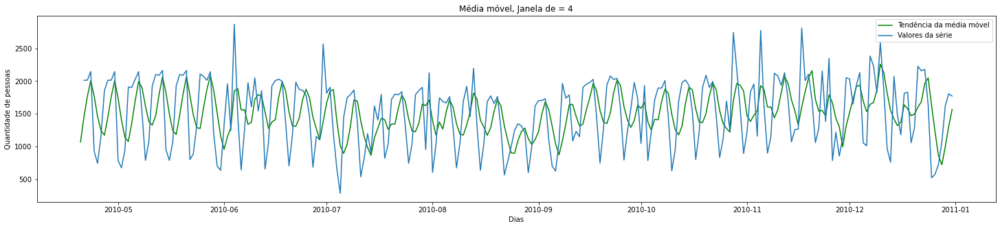

In [85]:
rolling_mean = df_time['traffic'].rolling(window=4).mean()

plt.figure(figsize=(25,5))
plt.title("Média móvel, Janela de = {}".format(4))
plt.plot(rolling_mean,color= "g", label="Tendência da média móvel")
plt.plot(df_time['traffic'][4:], label="Valores da série")
plt.xlabel('Dias')
plt.ylabel('Quantidade de pessoas')
plt.legend()
plt.show()

### 4.2 Teste de Dickey Fuller e auto-correlação <a name=autocorr></a>

Dentre algumas propriedades importante para construção de modelos está a compressão da estacionaridade da série temporal. Define-se um série temporal estacionária aquela onde os estimadores estatísticos não variam no tempo, por exemplo média, variância etc. O teste de Dickey Fuller calcular a significância com a qual podemos afirmar que uma série temporal é estacionária, onde a hipótese nula afirma que não há estacionaridade, ou seja, quando o p-valor é maior que 0.05, não podemos rejeitar a hipótese nula, e portanto não há estacionaridade. Para contornar isso, é possível realizar a diferenciação da série, e aplicar novamente o teste para identificar se a não estacionaridade ainda persiste, algo fundamental para criação dos modelos ARIMA.

In [86]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
        
        Função retirada de https://www.kaggle.com/kashnitsky/topic-9-part-1-time-series-analysis-in-python#Boosting
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
        
    with plt.style.context(style):    
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))
        
        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

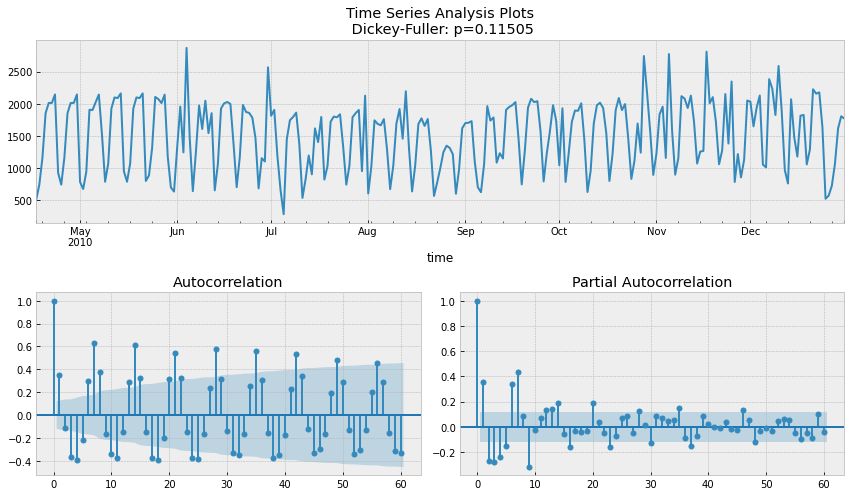

In [87]:
tsplot(df_time['traffic'], lags=60)

A série temporal não apresenta estacionaridade, como podemos verificar pelo p-valor do teste. Em seguida, realizamos a primeira diferenciação para averiguar se há estacionaridade:

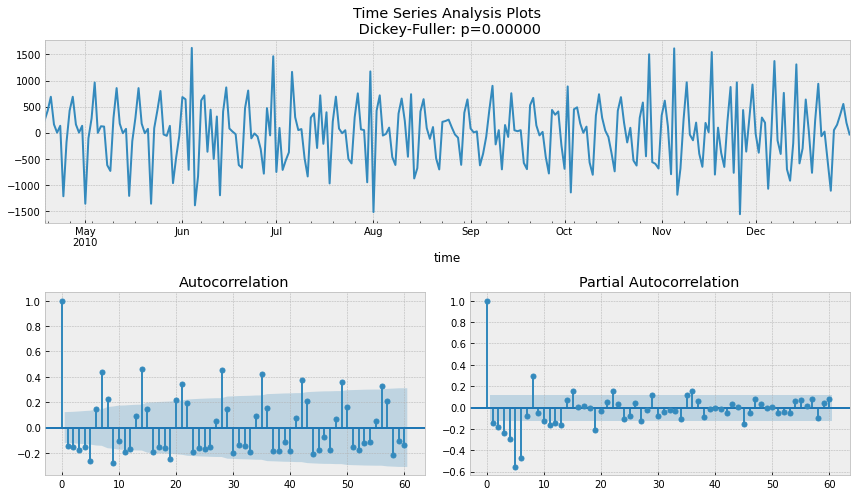

In [88]:
traffic_diff = df_time['traffic']-df_time['traffic'].shift(1)
tsplot(traffic_diff[1:], lags=60)

Agora podemos rejeitar a hipótese nula de que não há estacionaridade, pois o p-valor é menor que 0.05. A autocorrelação nos mostra valores altos ainda, o lag mais adequado poderia ser igual a 8.

## 5. Modelagem <a name=modelos></a>

Nesta seção, realizamos a etapa de modelagem, onde escolhemos alguns modelos para fazer as previsões de tráfego por aparelho, para a área de controle ca = A002, e aparelho scp = 02-00-00. Na nossa abordagem, estruturamos a modelagem da seguinte maneira:

- Modelos baseados unicamente na série temporal, sem criação de novas variáveis:
    - ARIMA
    - LGBM recursivo

- Modelos aplicados sobre dados tabulares criados a partir de engenharia de variáveis (com uma sub-seção dedicada a criação de novas variáveis):
    - Modelos de regressão linear
    - XGBoost
- Modelos de Deep Learning aplicados a séries temporais:
    - Multilayer Perceptron (MLP)
    - 1D Convolutional Neural Networks (CNN)
    - Long short-term memory (LSTM)

Primeiramente, definimos criamos a separação entre treino e teste, e criamos uma função que retorna as métricas:

In [89]:
y = df_time['traffic'].to_period('D')
y_train, y_test = temporal_train_test_split(y, test_size=15)
fh_abs = ForecastingHorizon(y_test.index, is_relative=False)

In [90]:
def metricas(y_train,y_test,y_pred,modelo):
    """
    Função que retorna as seguintes métricas do modelo:
    
    MAE: Mean Absolute Error;
    MAPE: Mean Absolute Percentage Error;
    RMSE: Root Mean Squared Error;
    RMSPE: Root Mean Squared Percentage Error;
    R2: R2 score.    
    """
    
    
    df_metrics = round(pd.DataFrame([['MAE',mean_absolute_error(y_test, y_pred)],
                              ['MAPE',mean_absolute_percentage_error(y_test, y_pred)],
                              ['RMSE',mean_squared_error(y_test, y_pred,square=True)],
                              ['RMSPE',mean_squared_percentage_error(y_test, y_pred,square=True)],
                              ['R2',r2_score(y_test, y_pred)]]),3)
    
    df_metrics.columns = ['Métricas', modelo]
    df_metrics.set_index('Métricas',inplace=True)
    
    plot_series(y_train.tail(50), y_test.tail(50), y_pred.tail(50), labels=["y_train", "y_test", "y_pred"])
    
    return df_metrics

### 5.1 ARIMA <a name=arima></a>

Apesar de havermos calculado, existe um método de cálculo dos parâmetro do modelo Arima automatizado, chamado no pacote auto-arima do sktime, que segue abaixo:

In [91]:
arima = AutoARIMA(sp=12,seasonal=True, suppress_warnings= True)
arima.fit(y_train)
y_pred_arima = arima.predict(fh=fh_abs)

,ARIMA
Métricas,
MAE,346.174
MAPE,0.271
RMSE,178905.917
RMSPE,0.129
R2,0.426


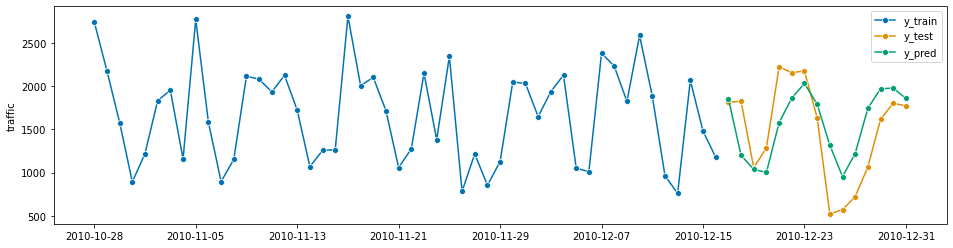

In [92]:
metricas_arima = metricas(y_train,y_test,y_pred_arima,'ARIMA')
metricas_arima

### 5.2 LightGBM <a name=lgbm></a>

In [93]:
lgbm = lgb.LGBMRegressor()
lgbm_forecast = make_reduction(lgbm, strategy="recursive")
lgbm_forecast.fit(y_train)
y_pred_lgbm = lgbm_forecast.predict(fh=fh_abs)

,ARIMA,LGBM
Métricas,,
MAE,346.174,378.963
MAPE,0.271,0.280
RMSE,178905.917,246240.078
RMSPE,0.129,0.160
R2,0.426,0.210


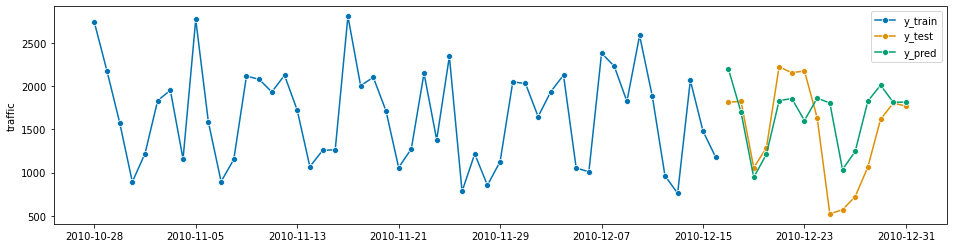

In [94]:
metricas_lgbm = metricas(y_train,y_test,y_pred_lgbm,'LGBM')
pd.concat([metricas_arima,metricas_lgbm],axis=1)

### 5.3 Engenharia de variáveis <a name=eng></a>

Os modelos acima propostos, utilizam-se unicamente da série temporal para realizar previsões, e não fazem uso de outras variáveis, como feriados, dia da semana, e outras variáveis que podem ser criadas a partir dos dados, como média da semana anterior, etc. Esta seção é dedicada a engenharia de variáveis.

In [95]:
df_eng = df_time[['weekday','holiday','traffic']].copy()
df_eng = pd.get_dummies(df_eng,columns=['weekday'])
df_eng.head()

,holiday,traffic,weekday_Dom,weekday_Qua,weekday_Qui,weekday_Seg,weekday_Sex,weekday_Sáb,weekday_Ter
time,,,,,,,,,
2010-04-17,0,507.0,0,0,0,0,0,1,0
2010-04-18,0,741.0,1,0,0,0,0,0,0
2010-04-19,0,1165.0,0,0,0,1,0,0,0
2010-04-20,0,1854.0,0,0,0,0,0,0,1
2010-04-21,0,2012.0,0,1,0,0,0,0,0


__time shift lags__

In [96]:
for i in range(6, 25):
    df_eng["lag_{}".format(i)] = df_eng['traffic'].shift(i)

In [97]:
df_eng.dropna(inplace=True)
df_eng.head()

,holiday,traffic,weekday_Dom,weekday_Qua,weekday_Qui,weekday_Seg,weekday_Sex,weekday_Sáb,weekday_Ter,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-05-11,0,1925.0,0,0,0,0,0,0,1,1903.0,1906.0,944.0,673.0,782.0,2145.0,2013.0,2012.0,1854.0,1165.0,741.0,925.0,2145.0,2013.0,2012.0,1854.0,1165.0,741.0,507.0
2010-05-12,0,2098.0,0,1,0,0,0,0,0,2026.0,1903.0,1906.0,944.0,673.0,782.0,2145.0,2013.0,2012.0,1854.0,1165.0,741.0,925.0,2145.0,2013.0,2012.0,1854.0,1165.0,741.0
2010-05-13,0,2088.0,0,0,1,0,0,0,0,2143.0,2026.0,1903.0,1906.0,944.0,673.0,782.0,2145.0,2013.0,2012.0,1854.0,1165.0,741.0,925.0,2145.0,2013.0,2012.0,1854.0,1165.0
2010-05-14,0,2161.0,0,0,0,0,1,0,0,1520.0,2143.0,2026.0,1903.0,1906.0,944.0,673.0,782.0,2145.0,2013.0,2012.0,1854.0,1165.0,741.0,925.0,2145.0,2013.0,2012.0,1854.0
2010-05-15,0,948.0,0,0,0,0,0,1,0,786.0,1520.0,2143.0,2026.0,1903.0,1906.0,944.0,673.0,782.0,2145.0,2013.0,2012.0,1854.0,1165.0,741.0,925.0,2145.0,2013.0,2012.0


In [98]:
def create_historical_features(data, column):
    
    """
    Função obtida de https://github.com/miltongneto/NYC-metro-flow-forecast
    """
    
    rolling_week_avg = data[column].shift(1).rolling(42).mean().rename('last_week_avg')
    rolling_week_median = data[column].shift(1).rolling(42).mean().rename('last_week_median')
    
    rolling_month_avg = data[column].shift(1).rolling(180).mean().rename('last_month_avg')
    rolling_month_median = data[column].shift(1).rolling(180).mean().rename('last_month_median')

    features = pd.concat([
        rolling_week_avg, rolling_week_median,
        rolling_month_avg, rolling_month_median
    ], axis=1)
    
    features = features.rename(columns=lambda x: column + '_' + x)
    
    return features

In [99]:
df_new_feat = create_historical_features(df_eng,'traffic')
df_eng_new = df_eng.merge(df_new_feat,left_index=True,right_index=True).fillna(0)
df_eng_new.tail()

,holiday,traffic,weekday_Dom,weekday_Qua,weekday_Qui,weekday_Seg,weekday_Sex,weekday_Sáb,weekday_Ter,lag_6,lag_7,lag_8,lag_9,lag_10,lag_11,lag_12,lag_13,lag_14,lag_15,lag_16,lag_17,lag_18,lag_19,lag_20,lag_21,lag_22,lag_23,lag_24,traffic_last_week_avg,traffic_last_week_median,traffic_last_month_avg,traffic_last_month_median
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-12-27,0,722.0,0,0,0,1,0,0,0,2225.0,1287.0,1056.0,1826.0,1814.0,1178.0,1480.0,2069.0,759.0,964.0,1886.0,2588.0,1825.0,2233.0,2383.0,1009.0,1053.0,2129.0,1938.0,1615.214286,1615.214286,1509.838889,1509.838889
2010-12-28,0,1065.0,0,0,0,0,0,0,1,2157.0,2225.0,1287.0,1056.0,1826.0,1814.0,1178.0,1480.0,2069.0,759.0,964.0,1886.0,2588.0,1825.0,2233.0,2383.0,1009.0,1053.0,2129.0,1602.500000,1602.500000,1499.588889,1499.588889
2010-12-29,0,1616.0,0,1,0,0,0,0,0,2177.0,2157.0,2225.0,1287.0,1056.0,1826.0,1814.0,1178.0,1480.0,2069.0,759.0,964.0,1886.0,2588.0,1825.0,2233.0,2383.0,1009.0,1053.0,1597.738095,1597.738095,1495.433333,1495.433333
2010-12-30,0,1805.0,0,0,1,0,0,0,0,1635.0,2177.0,2157.0,2225.0,1287.0,1056.0,1826.0,1814.0,1178.0,1480.0,2069.0,759.0,964.0,1886.0,2588.0,1825.0,2233.0,2383.0,1009.0,1569.285714,1569.285714,1493.833333,1493.833333
2010-12-31,1,1770.0,0,0,0,0,1,0,0,521.0,1635.0,2177.0,2157.0,2225.0,1287.0,1056.0,1826.0,1814.0,1178.0,1480.0,2069.0,759.0,964.0,1886.0,2588.0,1825.0,2233.0,2383.0,1564.476190,1564.476190,1497.255556,1497.255556


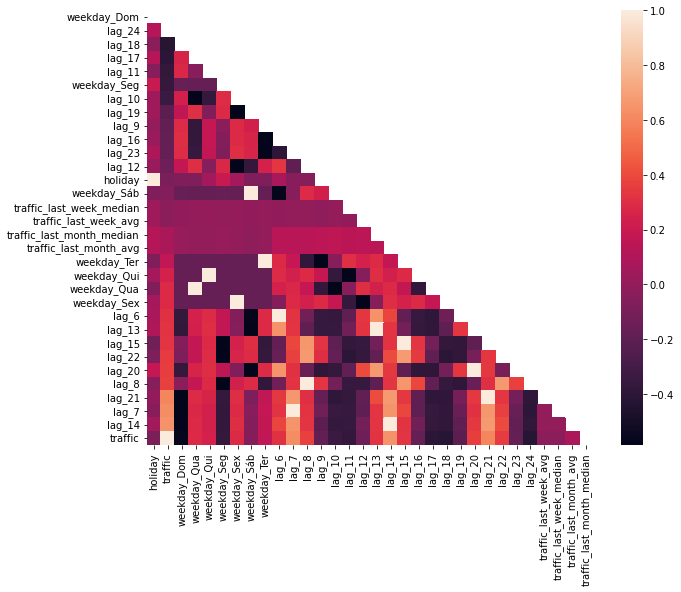

In [100]:
plt.figure(figsize=(10, 8))
df_corr = df_eng_new.corr().sort_values(by='traffic')
mask = np.zeros_like(df_corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
df_corr[mask] = np.nan
sns.heatmap(df_corr)
plt.show()

Percebemos alta correlacão do tráfego com a média da semana anterior e de duas semana atrás, assim como o lag 8 sugerido pela nossa avaliação da auto-correlação.

### 5.4 Regressão linear simples e importância de variáveis <a name=linear></a>

In [101]:
X = df_eng_new.drop('traffic',axis=1)
y = df_eng_new['traffic'].to_period('D')

X_train_new,X_test_new,y_train_new, y_test_new = temporal_train_test_split(X,y, test_size=15)

In [102]:
lr = LinearRegression()
lr.fit(X_train_new, y_train_new)
y_pred_lr = pd.Series(lr.predict(X=X_test_new),index=y_test_new.index)

,ARIMA,LGBM,Linear Regression
Métricas,,,
MAE,346.174,378.963,343.530
MAPE,0.271,0.280,0.261
RMSE,178905.917,246240.078,191344.957
RMSPE,0.129,0.160,0.136
R2,0.426,0.210,0.386


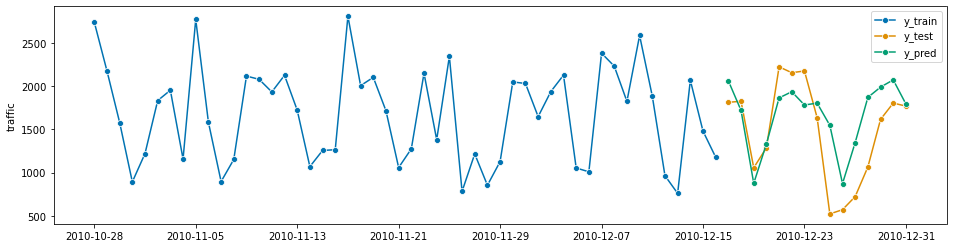

In [103]:
metricas_lr = metricas(y_train,y_test,y_pred_lr,'Linear Regression')
pd.concat([metricas_arima,metricas_lgbm,metricas_lr],axis=1)

In [104]:
def plotCoefficients(model,figsize=(8, 12),min_coef=0.1):
    """
        Plots sorted coefficient values of the model
        
        Função obtida de https://www.kaggle.com/kashnitsky/topic-9-part-1-time-series-analysis-in-python#Boosting
    """
    
    coefs = pd.DataFrame(model.coef_, X_train_new.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs[np.abs(coefs)>min_coef].sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    plt.figure(figsize=figsize)
    sns.barplot(y=coefs.coef.index,x=coefs.coef,palette='deep')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');

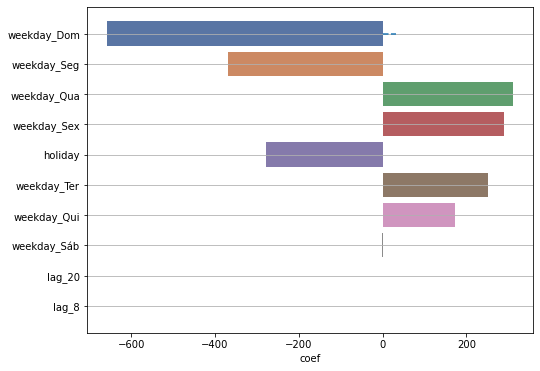

In [105]:
plotCoefficients(lr,figsize=(8, 6))

#### 5.4.1 Scaling <a name=scaling></a>

In [106]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

In [107]:
lr_scaled = LinearRegression()
lr_scaled.fit(X_train_scaled, y_train_new)
y_pred_lr_scaled = pd.Series(lr.predict(X=X_test_scaled),index=y_test_new.index)

,ARIMA,LGBM,Linear Regression,Linear Regression Scaled
Métricas,,,,
MAE,346.174,378.963,343.530,728.243
MAPE,0.271,0.280,0.261,0.784
RMSE,178905.917,246240.078,191344.957,771754.432
RMSPE,0.129,0.160,0.136,1.070
R2,0.426,0.210,0.386,-1.477


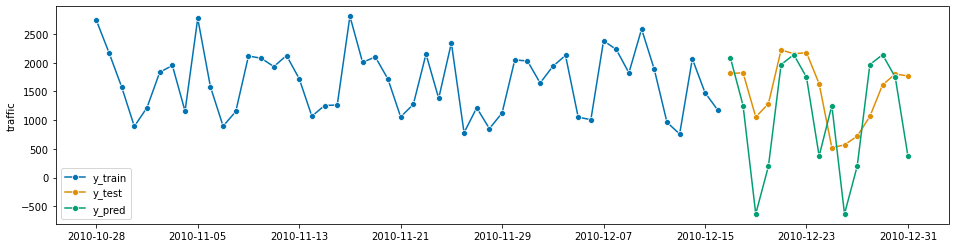

In [108]:
metricas_lr_scaled = metricas(y_train,y_test,y_pred_lr_scaled,'Linear Regression Scaled')
pd.concat([metricas_arima,metricas_lgbm,metricas_lr,metricas_lr_scaled],axis=1)

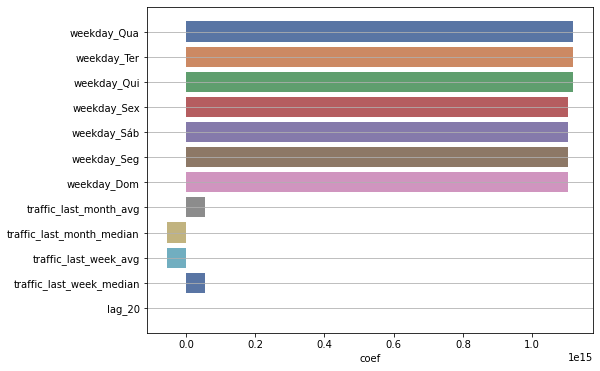

In [109]:
plotCoefficients(lr_scaled,figsize=(8, 6),min_coef=80)

#### 5.4.2 Ridge <a name=ridge></a>

In [110]:
ridge = RidgeCV()
ridge.fit(X_train_scaled, y_train_new)

RidgeCV(alphas=array([ 0.1,  1. , 10. ]))

In [111]:
y_pred_ridge = pd.Series(ridge.predict(X=X_test_scaled),index=y_test_new.index)

,ARIMA,LGBM,Linear Regression,Linear Regression Scaled,Ridge
Métricas,,,,,
MAE,346.174,378.963,343.530,728.243,344.468
MAPE,0.271,0.280,0.261,0.784,0.262
RMSE,178905.917,246240.078,191344.957,771754.432,205085.650
RMSPE,0.129,0.160,0.136,1.070,0.144
R2,0.426,0.210,0.386,-1.477,0.342


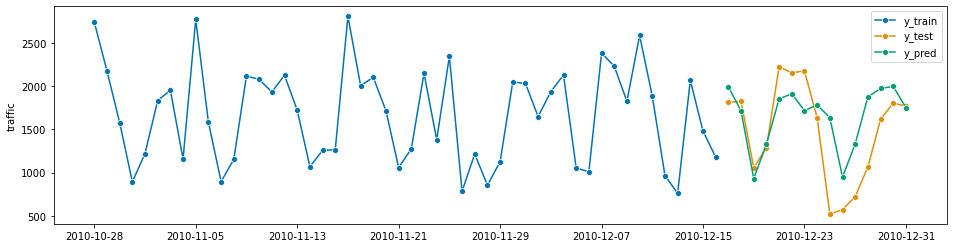

In [112]:
metricas_ridge = metricas(y_train,y_test,y_pred_ridge,'Ridge')
pd.concat([metricas_arima,metricas_lgbm,metricas_lr,metricas_lr_scaled,metricas_ridge],axis=1)

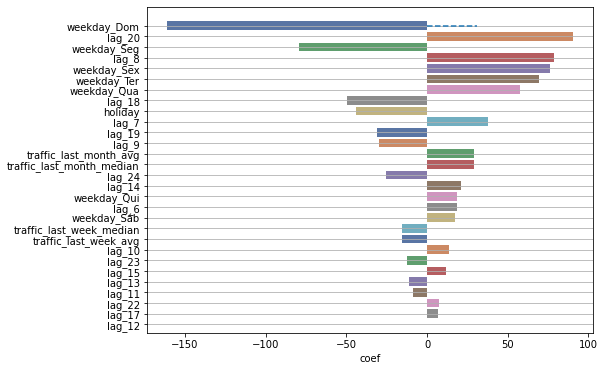

In [113]:
plotCoefficients(ridge,figsize=(8, 6),min_coef=6)

#### 5.4.3 Lasso <a name=lasso></a>

In [114]:
lasso = LassoCV()
lasso.fit(X_train_scaled, y_train_new)

LassoCV()

In [115]:
y_pred_lasso = pd.Series(lasso.predict(X=X_test_scaled),index=y_test_new.index)

,ARIMA,LGBM,Linear Regression,Linear Regression Scaled,Ridge,Lasso
Métricas,,,,,,
MAE,346.174,378.963,343.530,728.243,344.468,341.920
MAPE,0.271,0.280,0.261,0.784,0.262,0.261
RMSE,178905.917,246240.078,191344.957,771754.432,205085.650,205663.777
RMSPE,0.129,0.160,0.136,1.070,0.144,0.144
R2,0.426,0.210,0.386,-1.477,0.342,0.340


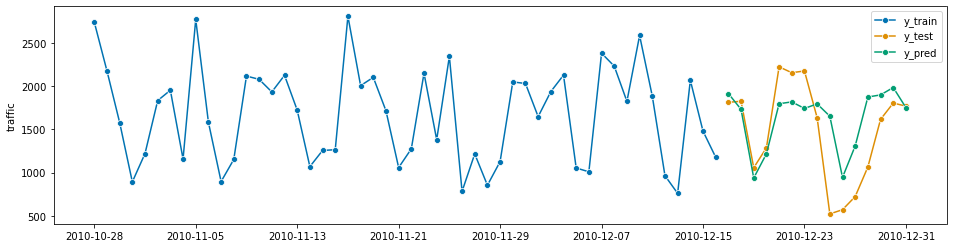

In [116]:
metricas_lasso = metricas(y_train,y_test,y_pred_lasso,'Lasso')
pd.concat([metricas_arima,metricas_lgbm,metricas_lr,metricas_lr_scaled,metricas_ridge,metricas_lasso],axis=1)

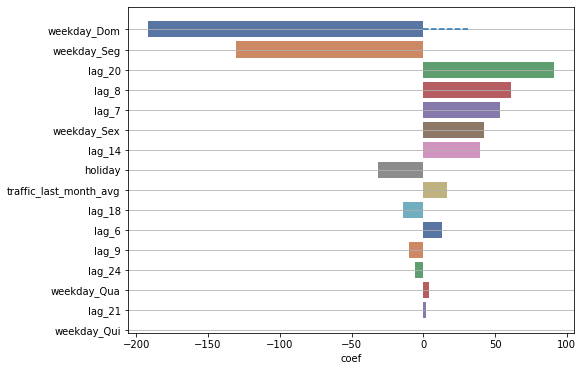

In [117]:
plotCoefficients(lasso,figsize=(8, 6),min_coef=0)

### 5.5 XGBoost regressor <a name=xgb></a>

In [118]:
xgb = XGBRegressor()
xgb.fit(X_train_new, y_train_new)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [119]:
y_pred_xgb = pd.Series(xgb.predict(X_test_new),index=y_test_new.index)

,ARIMA,LGBM,Linear Regression,Linear Regression Scaled,Ridge,Lasso,XGBoost
Métricas,,,,,,,
MAE,346.174,378.963,343.530,728.243,344.468,341.920,380.992
MAPE,0.271,0.280,0.261,0.784,0.262,0.261,0.292
RMSE,178905.917,246240.078,191344.957,771754.432,205085.650,205663.777,245440.031
RMSPE,0.129,0.160,0.136,1.070,0.144,0.144,0.156
R2,0.426,0.210,0.386,-1.477,0.342,0.340,0.212


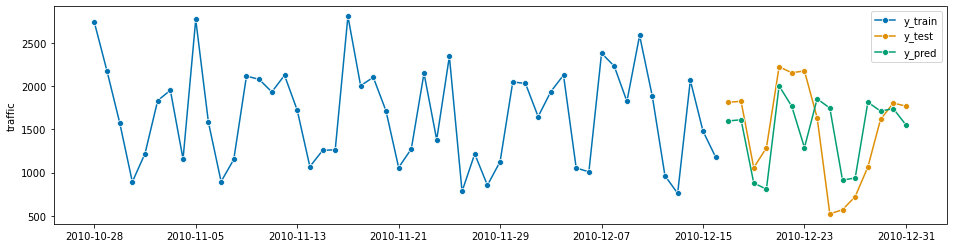

In [120]:
metricas_xgb = metricas(y_train,y_test,y_pred_xgb,'XGBoost')
pd.concat([metricas_arima,metricas_lgbm,metricas_lr,metricas_lr_scaled,metricas_ridge,metricas_lasso,metricas_xgb],axis=1)

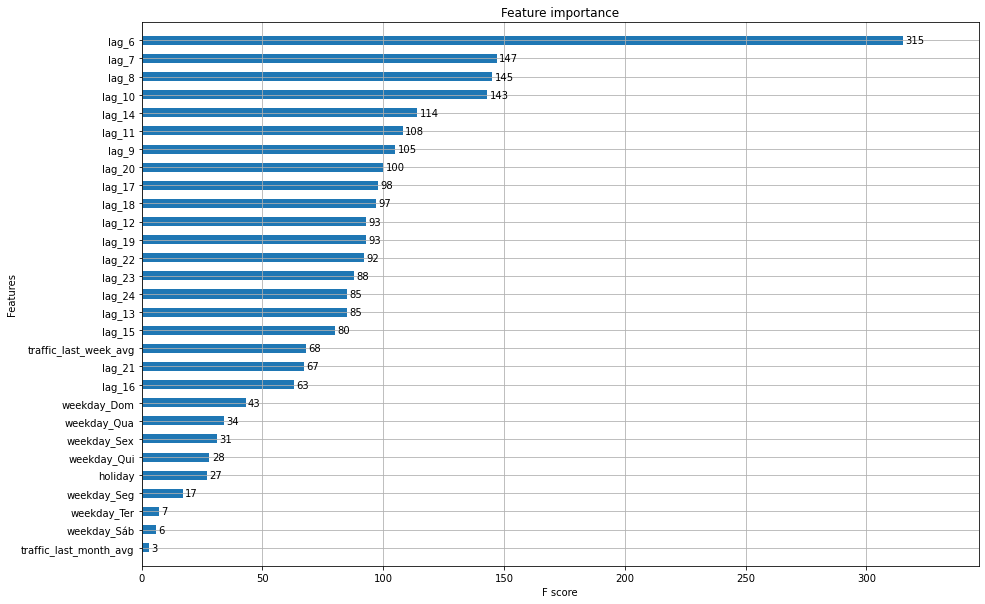

In [121]:
plt.rcParams["figure.figsize"] = (15,10)
plot_importance(xgb,height=0.5)
plt.show()

## 6. Modelos de Deep Learning para séries temporais <a name=deep></a>

### 6.1 MLP <a name=mlp></a>

In [122]:
epochs = 40
batch = 256
lr = 0.0003
adam = optimizers.adam_v2

In [123]:
mlp = Sequential()
mlp.add(Dense(100, activation='relu', input_dim=X_train_new.shape[1]))
mlp.add(Dense(1))
mlp.compile(loss='mape', optimizer='adam')
mlp.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 100)               3200      
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 101       
Total params: 3,301
Trainable params: 3,301
Non-trainable params: 0
_________________________________________________________________


In [124]:
mlp_history = mlp.fit(X_train_new.values, y_train_new, validation_data=(X_test_new.values, y_test_new), epochs=epochs,verbose=0)

In [125]:
y_pred_mlp = pd.Series(mlp.predict(X_test_new).reshape(1,-1)[0],index=y_test_new.index)

,ARIMA,LGBM,Linear Regression,Linear Regression Scaled,Ridge,Lasso,XGBoost,MLP
Métricas,,,,,,,,
MAE,346.174,378.963,343.530,728.243,344.468,341.920,380.992,367.714
MAPE,0.271,0.280,0.261,0.784,0.262,0.261,0.292,0.281
RMSE,178905.917,246240.078,191344.957,771754.432,205085.650,205663.777,245440.031,237744.433
RMSPE,0.129,0.160,0.136,1.070,0.144,0.144,0.156,0.151
R2,0.426,0.210,0.386,-1.477,0.342,0.340,0.212,0.237


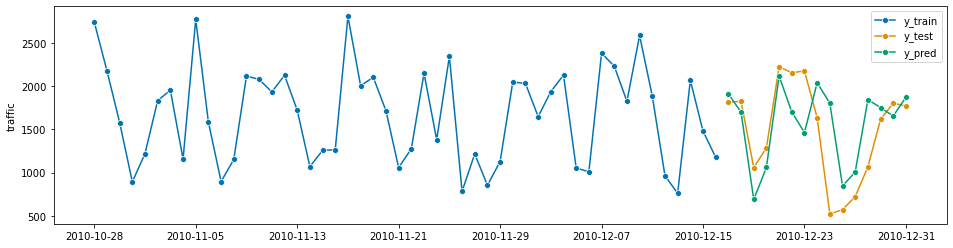

In [126]:
metricas_mlp = metricas(y_train_new,y_test_new,y_pred_mlp,'MLP')
pd.concat([metricas_arima,metricas_lgbm,metricas_lr,metricas_lr_scaled,metricas_ridge,metricas_lasso,metricas_xgb,metricas_mlp],axis=1)

### 6.2 CNN <a name=cnn></a>

In [127]:
X_train_series = X_train_new.values.reshape((X_train_new.shape[0], X_train_new.shape[1], 1))
X_test_series = X_test_new.values.reshape((X_test_new.shape[0], X_test_new.shape[1], 1))
print('Train set shape', X_train_series.shape)
print('Validation set shape', X_test_series.shape)

Train set shape (220, 31, 1)
Validation set shape (15, 31, 1)


In [128]:
cnn = Sequential()
cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
cnn.add(MaxPooling1D(pool_size=2))
cnn.add(Flatten())
cnn.add(Dense(50, activation='relu'))
cnn.add(Dense(1))
cnn.compile(loss='mape', optimizer='adam')
cnn.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 30, 64)            192       
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 15, 64)            0         
_________________________________________________________________
flatten (Flatten)            (None, 960)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 50)                48050     
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 51        
Total params: 48,293
Trainable params: 48,293
Non-trainable params: 0
_________________________________________________________________


In [129]:
cnn_history = cnn.fit(X_train_series, y_train_new, validation_data=(X_test_series, y_test_new), epochs=epochs, verbose=0)

In [130]:
y_pred_cnn = pd.Series(cnn.predict(X_test_series).reshape(1,-1)[0],index=y_test_new.index)

,ARIMA,LGBM,Linear Regression,Linear Regression Scaled,Ridge,Lasso,XGBoost,MLP,CNN
Métricas,,,,,,,,,
MAE,346.174,378.963,343.530,728.243,344.468,341.920,380.992,367.714,429.446
MAPE,0.271,0.280,0.261,0.784,0.262,0.261,0.292,0.281,0.319
RMSE,178905.917,246240.078,191344.957,771754.432,205085.650,205663.777,245440.031,237744.433,258353.818
RMSPE,0.129,0.160,0.136,1.070,0.144,0.144,0.156,0.151,0.164
R2,0.426,0.210,0.386,-1.477,0.342,0.340,0.212,0.237,0.171


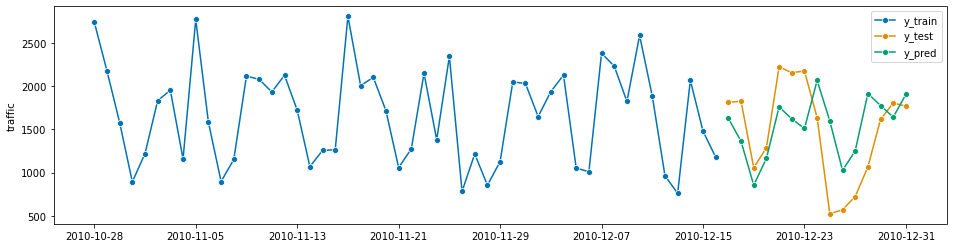

In [131]:
metricas_cnn = metricas(y_train_new,y_test_new,y_pred_cnn,'CNN')
pd.concat([metricas_arima,metricas_lgbm,metricas_lr,metricas_lr_scaled,metricas_ridge,metricas_lasso,metricas_xgb,metricas_mlp,metricas_cnn],axis=1)

### 6.3 LSTM <a name=lstm></a>

In [132]:
lstm = Sequential()
lstm.add(LSTM(50, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
lstm.add(Dense(1))
lstm.compile(loss='mape', optimizer='adam')
lstm.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 50)                10400     
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 51        
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________


In [133]:
lstm_history = lstm.fit(X_train_series, y_train_new, validation_data=(X_test_series, y_test_new), epochs=40, verbose=0)

In [134]:
y_pred_lstm = pd.Series(lstm.predict(X_test_series).reshape(1,-1)[0],index=y_test_new.index)

,ARIMA,LGBM,Linear Regression,Linear Regression Scaled,Ridge,Lasso,XGBoost,MLP,CNN,LSTM
Métricas,,,,,,,,,,
MAE,346.174,378.963,343.530,728.243,344.468,341.920,380.992,367.714,429.446,664.508
MAPE,0.271,0.280,0.261,0.784,0.262,0.261,0.292,0.281,0.319,0.514
RMSE,178905.917,246240.078,191344.957,771754.432,205085.650,205663.777,245440.031,237744.433,258353.818,566380.137
RMSPE,0.129,0.160,0.136,1.070,0.144,0.144,0.156,0.151,0.164,0.325
R2,0.426,0.210,0.386,-1.477,0.342,0.340,0.212,0.237,0.171,-0.818


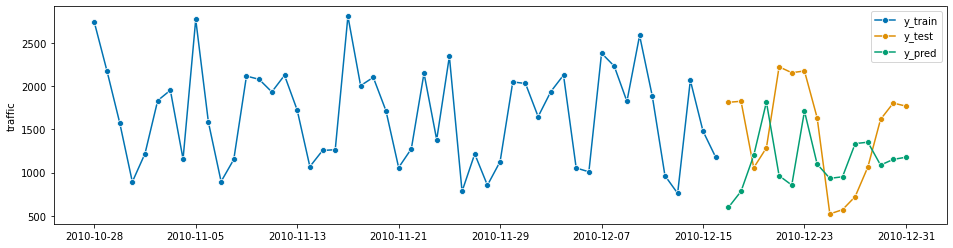

In [135]:
metricas_lstm = metricas(y_train_new,y_test_new,y_pred_lstm,'LSTM')
pd.concat([metricas_arima,metricas_lgbm,metricas_lr,metricas_lr_scaled,metricas_ridge,metricas_lasso,metricas_xgb,metricas_mlp,metricas_cnn,metricas_lstm],axis=1)

## 7. Considerações finais <a name=conclusao></a>

No presente relatório, construímos uma análise descritiva, exploratória e preditiva dos dados apresentados no desafio de ciência de dados da Raízen. O problema proposto trata de registros de auditorias realizadas no metrô de Nova York, um os maiores e mais antigos do mundo, onde o objetivo é realizar previsões sobre o fluxo de passageiros do metrô. Foi nos dada a liberdade para escolher o período e variável a ser predita, assim como análise a ser desenvolvida. Optamos por uma análise diária do fluxo de passageiros (variável "traffic", criada a partir da soma de "entries" com "exits"). Dentre os modelos apresentados, encontram-se:

- ARIMA
- LGBM
- Regressores lineraes (simples, ridge e lasso)
- XGBoost
- Modelos de deep learning (MLP, CNN, LSTM)

Com base nas métricas calculadas, concluímos que os três melhores modelos utilizados são:

1. ARIMA
2. Modelos lineraes de modo geral
3. LGBM, apesar de ser bem similar ao modelo XGBoost, necessitando uma análise mais aprofundada.

Também realizamos uma análise exploratória dos dados, identificando dias da semana com maior fluxo, assim como meses, e influência dos feriados, além de evidenciar as estações com maior tráfego.

### 7.1 Perpectivas <a name=perspectivas></a>

Como perspectivas elencamos:

- Explicar com maiores detalhes a teoria por trás de cada modelo;
- Realizar testes estatísticos para averiguar a influência de dias da semana e feriados sobre a distriuição dos dados;
- Realizar cross-validation para calcular métricas dos modelos;
- Aplicar a modelagem para toda a base de dados, inclusive de outros anos;
- Testar modelo Prophet.
- Realizar uma análise mais completa dos dados.

## Referências <a name=refs></a>

__Wikipédia__

- https://pt.wikipedia.org/wiki/Metropolitano_de_Nova_Iorque

__Github__

- https://github.com/miltongneto/NYC-metro-flow-forecast
- https://github.com/rjh336/mta_metis

__Kaggle__

- https://www.kaggle.com/dimitreoliveira/deep-learning-for-time-series-forecasting
- https://www.kaggle.com/ekrembayar/store-sales-ts-forecasting-a-comprehensive-guide
- https://www.kaggle.com/kashnitsky/topic-9-part-1-time-series-analysis-in-python#Boosting

__Medium__

- https://towardsdatascience.com/multi-step-time-series-forecasting-with-arima-lightgbm-and-prophet-cc9e3f95dfb0

__Livros__

- https://otexts.com/fpp3/